In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 384), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  604.178 2.95045 0.288766


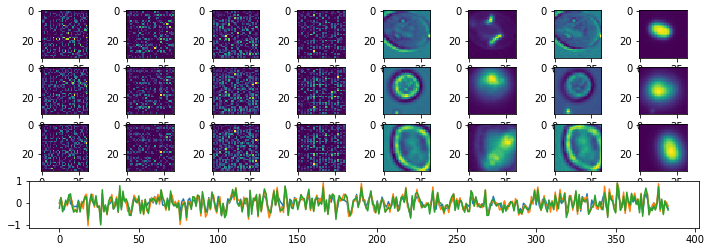

Epoch:  1 Iteration:  0 Loss:  19.0449 0.638379 0.0021798


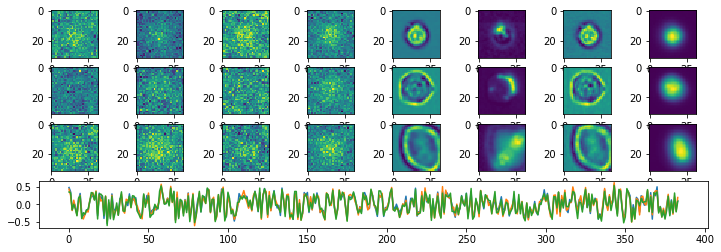

Epoch:  2 Iteration:  0 Loss:  15.4696 0.636336 0.00257635


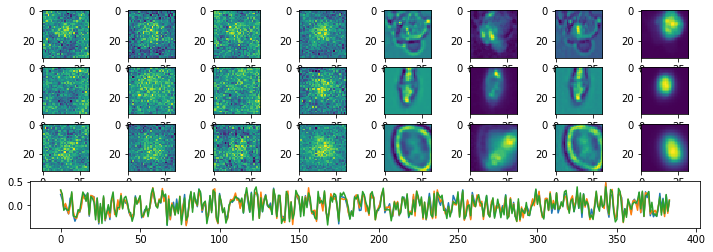

Epoch:  3 Iteration:  0 Loss:  13.6917 0.635328 0.000518709


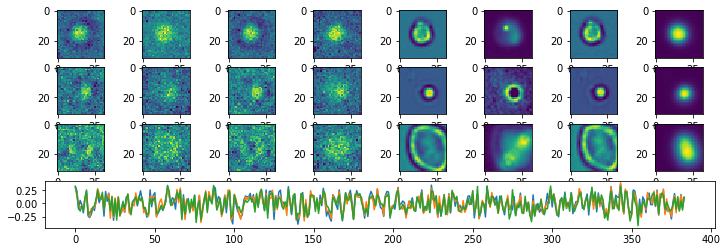

Epoch:  4 Iteration:  0 Loss:  11.5966 0.634261 0.00116274


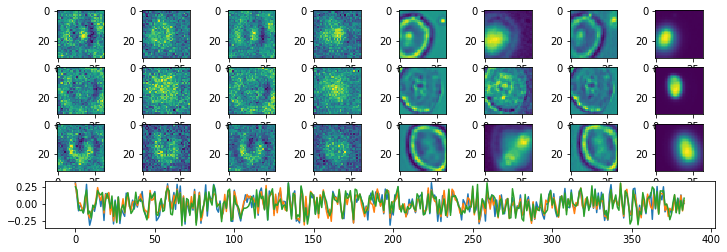

Epoch:  5 Iteration:  0 Loss:  10.2997 0.633592 0.00142369


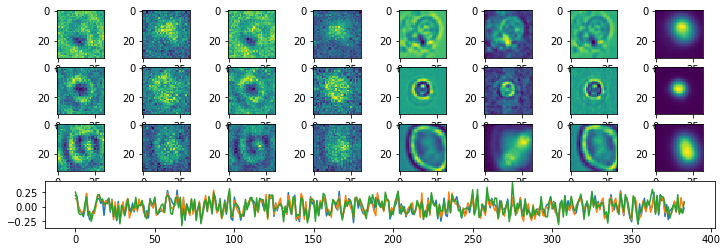

Epoch:  6 Iteration:  0 Loss:  9.21399 0.633013 0.00165933


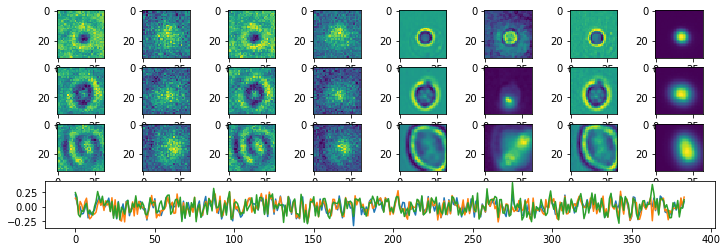

Epoch:  7 Iteration:  0 Loss:  8.86456 0.632851 0.00131106


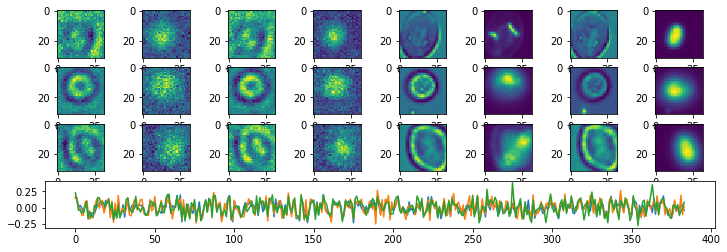

Epoch:  8 Iteration:  0 Loss:  8.41969 0.632593 0.00215551


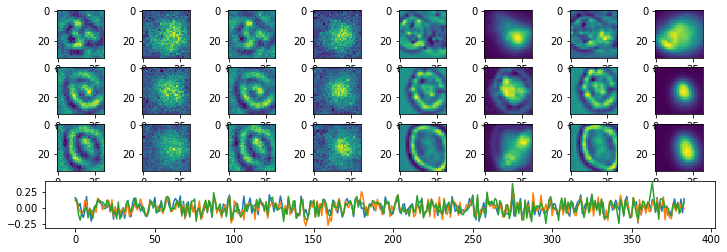

Epoch:  9 Iteration:  0 Loss:  7.38011 0.632041 0.000651807


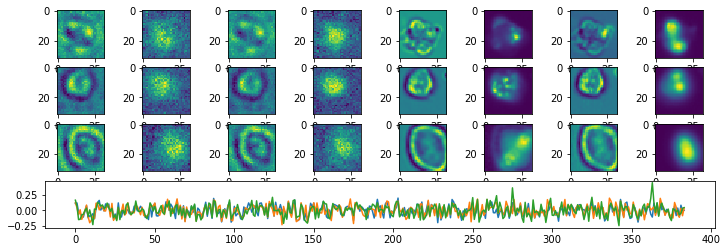

Epoch:  10 Iteration:  0 Loss:  6.94881 0.631817 0.00125495


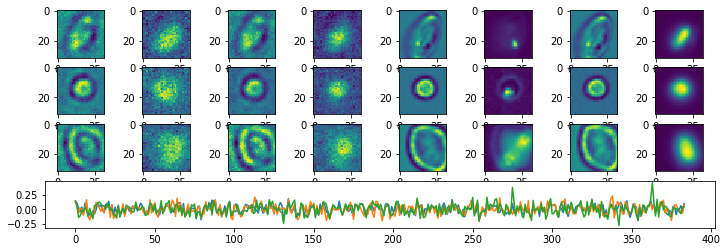

Epoch:  11 Iteration:  0 Loss:  6.59639 0.631631 0.000844657


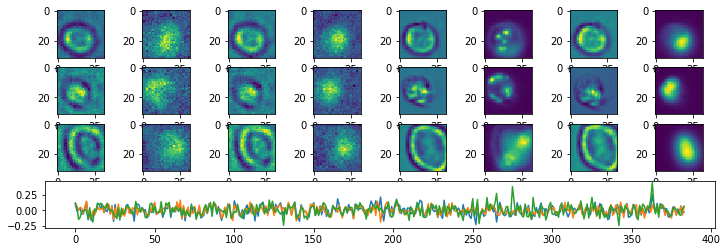

Epoch:  12 Iteration:  0 Loss:  6.34336 0.631499 0.00122446


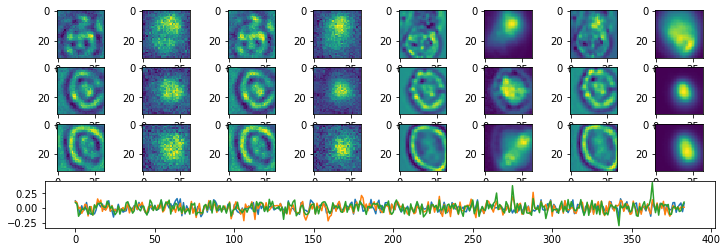

Epoch:  13 Iteration:  0 Loss:  6.08386 0.631362 0.00101683


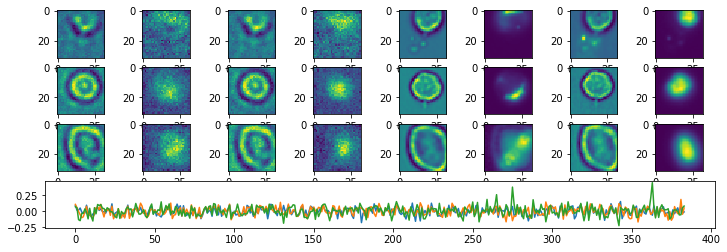

Epoch:  14 Iteration:  0 Loss:  5.81809 0.63122 0.00120878


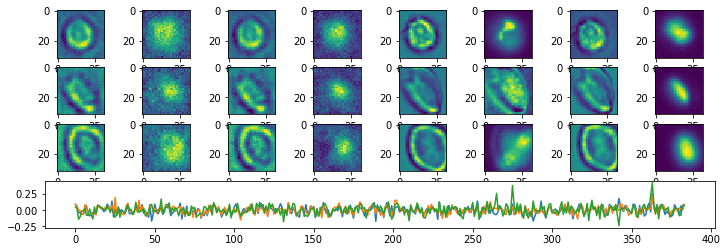

Epoch:  15 Iteration:  0 Loss:  5.63821 0.631122 0.00124907


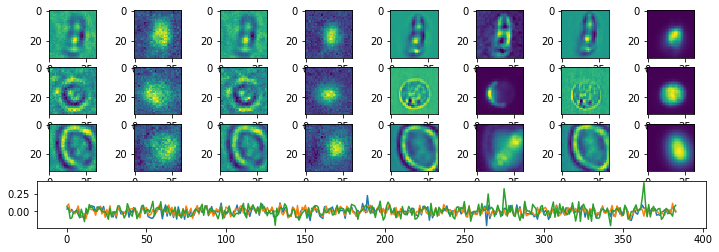

Epoch:  16 Iteration:  0 Loss:  5.59075 0.631093 0.00159872


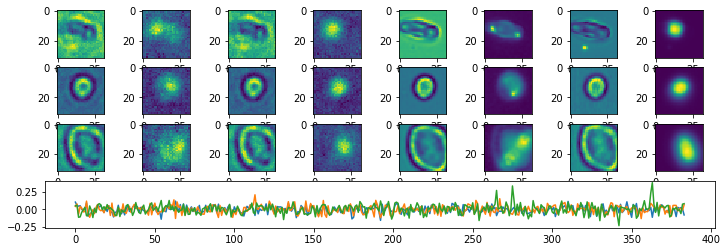

Epoch:  17 Iteration:  0 Loss:  5.20297 0.630888 0.000943691


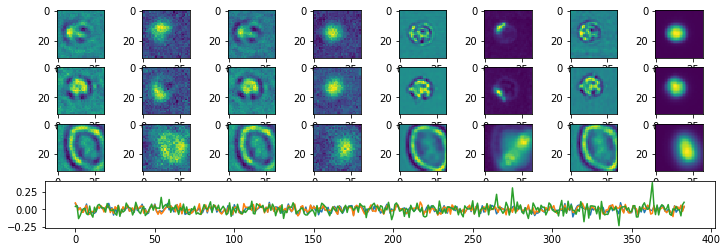

Epoch:  18 Iteration:  0 Loss:  5.03301 0.630799 0.000843883


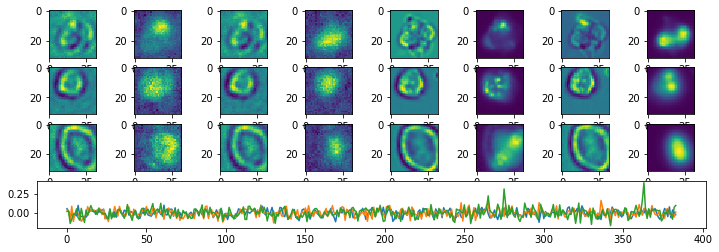

Epoch:  19 Iteration:  0 Loss:  4.88846 0.630722 0.0010511


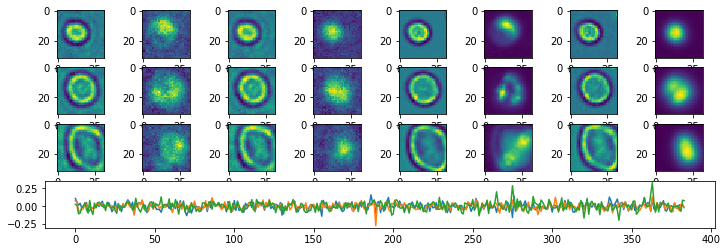

Epoch:  20 Iteration:  0 Loss:  4.75728 0.630653 0.000350237


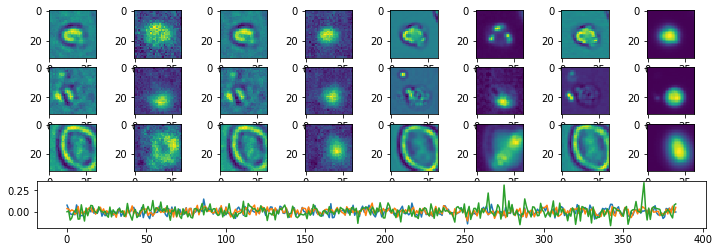

Epoch:  21 Iteration:  0 Loss:  4.62909 0.630585 0.000669152


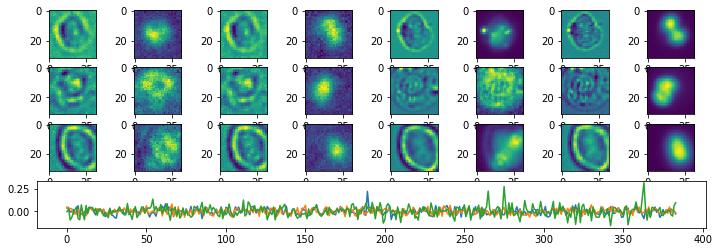

Epoch:  22 Iteration:  0 Loss:  4.57191 0.63056 0.000715077


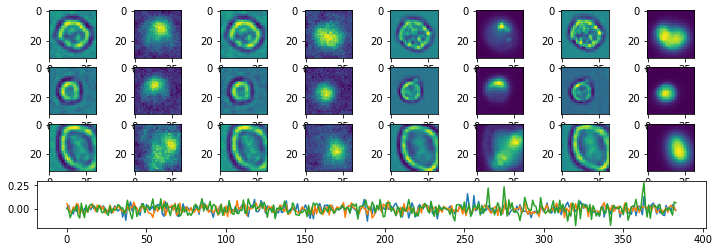

Epoch:  23 Iteration:  0 Loss:  4.40306 0.630468 0.000852048


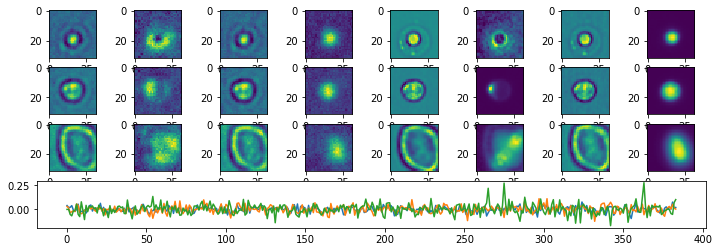

Epoch:  24 Iteration:  0 Loss:  4.33786 0.630433 0.00067535


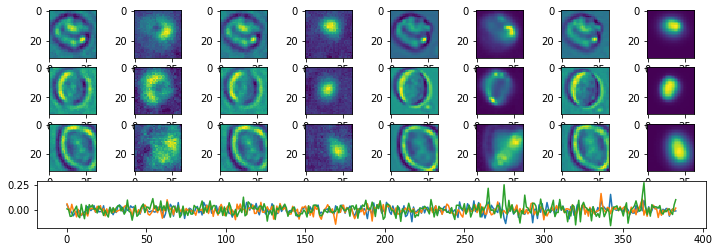

Epoch:  25 Iteration:  0 Loss:  4.26211 0.630393 0.00105727


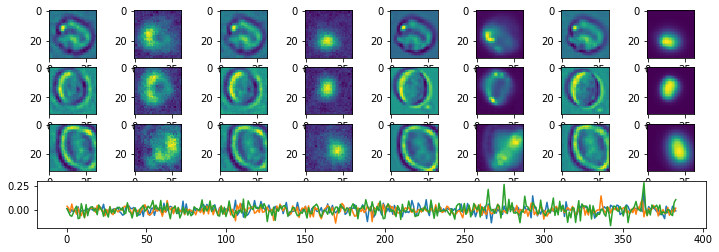

Epoch:  26 Iteration:  0 Loss:  4.16203 0.63034 0.000803679


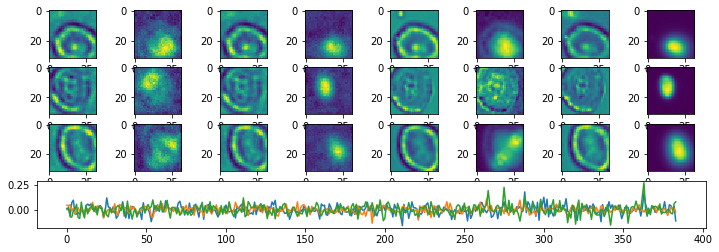

Epoch:  27 Iteration:  0 Loss:  4.20701 0.630364 0.000909239


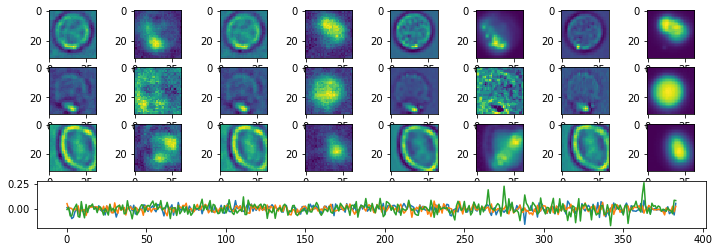

Epoch:  28 Iteration:  0 Loss:  3.99504 0.630258 0.000257462


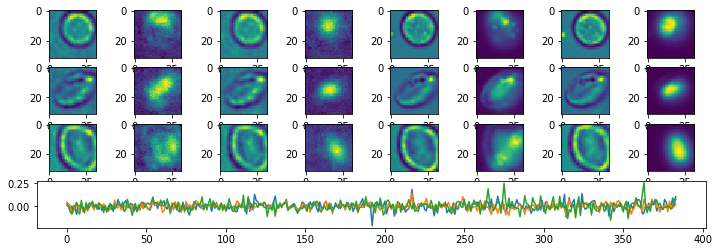

Epoch:  29 Iteration:  0 Loss:  3.93475 0.63022 0.000809252


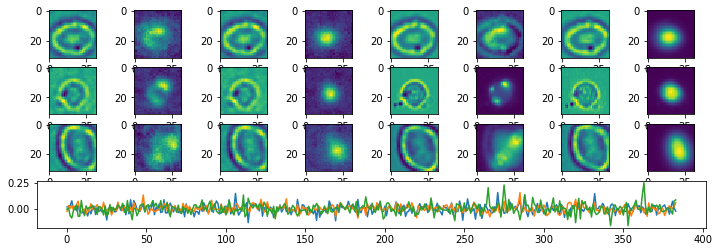

Epoch:  30 Iteration:  0 Loss:  3.87246 0.630188 0.000358641


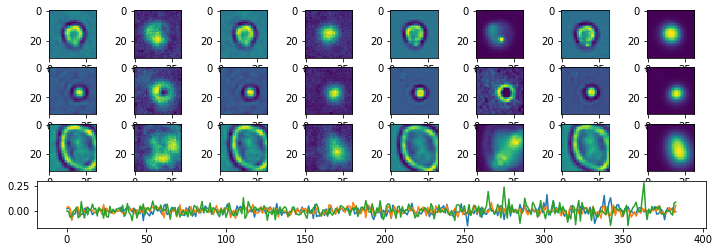

Epoch:  31 Iteration:  0 Loss:  3.81022 0.630155 0.000569344


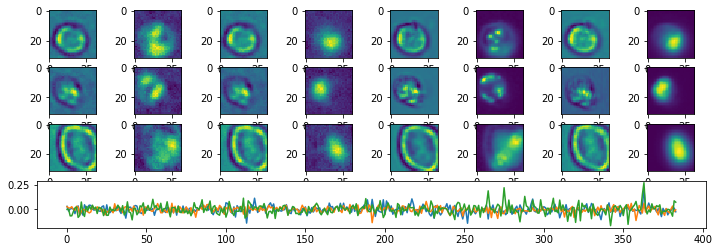

Epoch:  32 Iteration:  0 Loss:  3.79005 0.630144 0.000806719


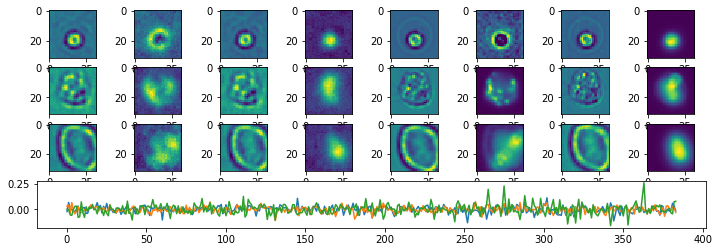

Epoch:  33 Iteration:  0 Loss:  3.71602 0.630105 0.00102139


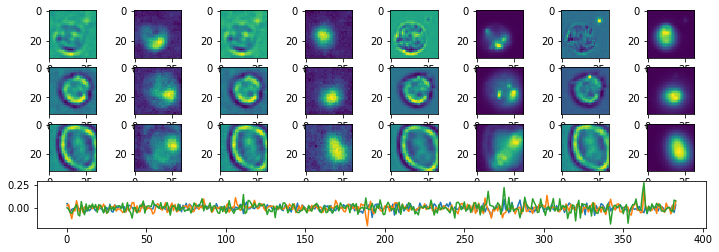

Epoch:  34 Iteration:  0 Loss:  3.64052 0.630066 0.000608832


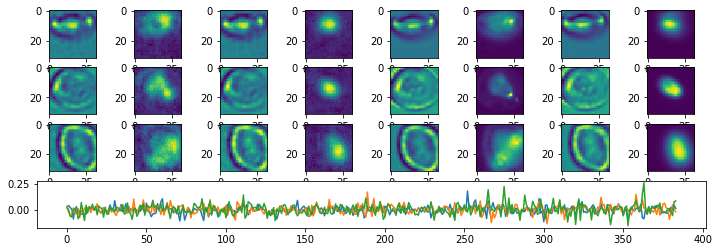

Epoch:  35 Iteration:  0 Loss:  3.60508 0.63005 7.04229e-05


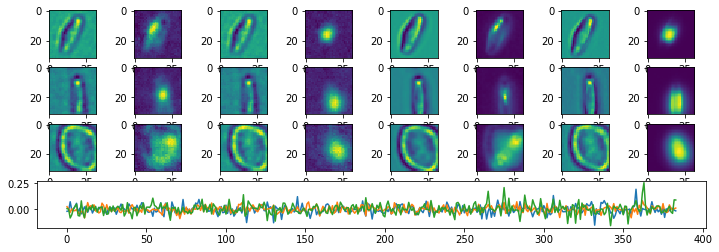

Epoch:  36 Iteration:  0 Loss:  3.55194 0.63002 0.000221074


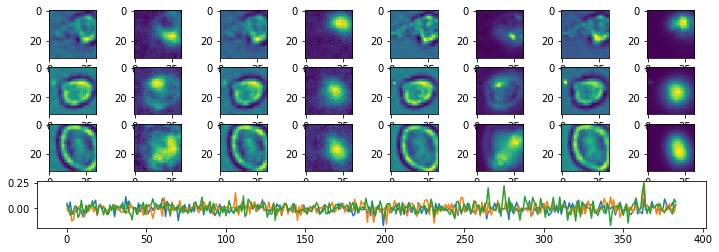

Epoch:  37 Iteration:  0 Loss:  3.50212 0.629994 0.000415862


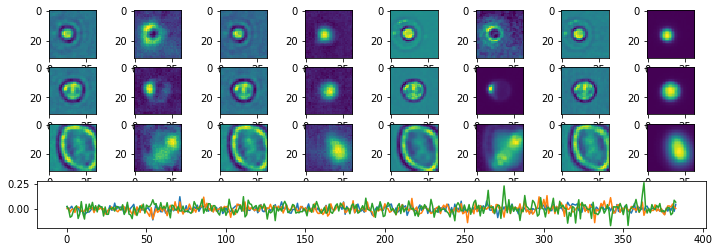

Epoch:  38 Iteration:  0 Loss:  3.42428 0.629954 0.000452012


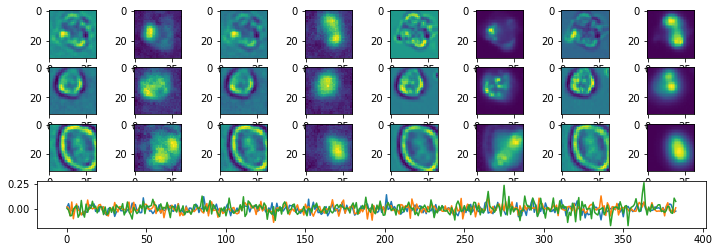

Epoch:  39 Iteration:  0 Loss:  3.43925 0.629961 0.000673681


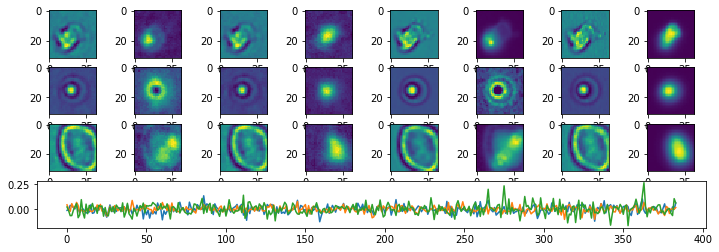

Epoch:  40 Iteration:  0 Loss:  3.33032 0.629906 0.000638962


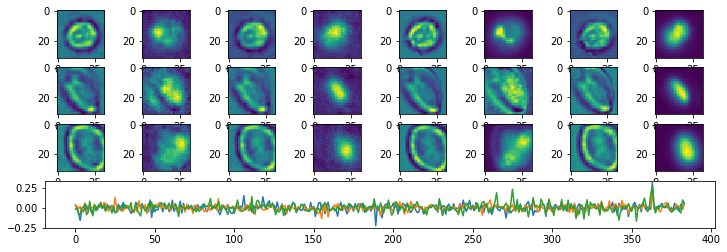

Epoch:  41 Iteration:  0 Loss:  3.27749 0.629877 0.000900596


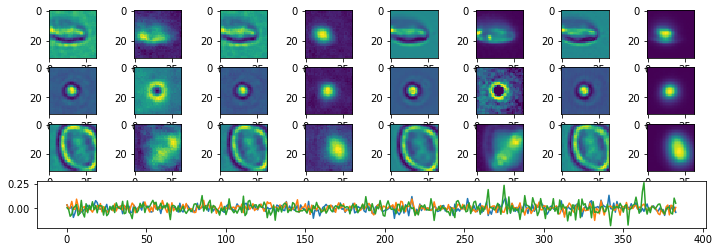

Epoch:  42 Iteration:  0 Loss:  3.26115 0.62987 0.000489771


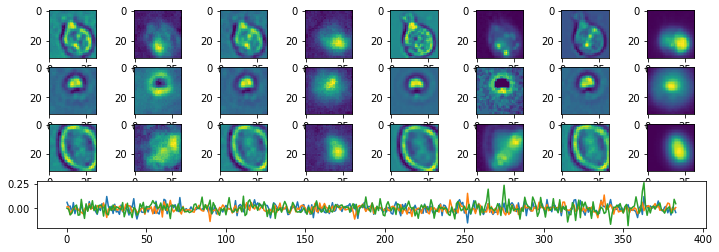

Epoch:  43 Iteration:  0 Loss:  3.15691 0.629815 0.000415772


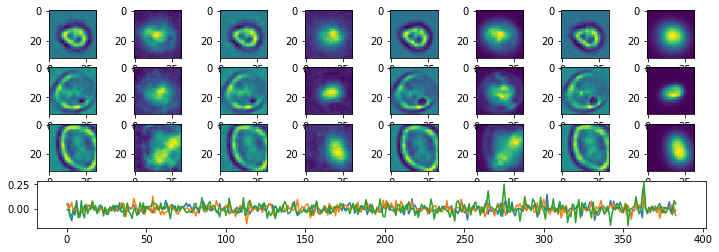

Epoch:  44 Iteration:  0 Loss:  3.13825 0.629807 0.000374585


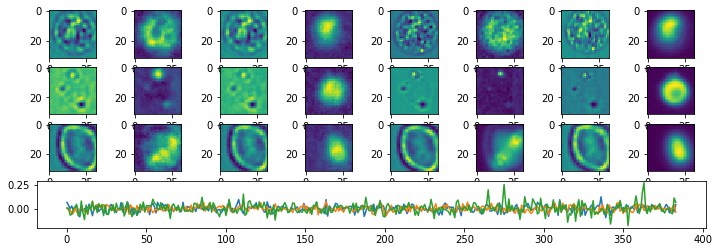

Epoch:  45 Iteration:  0 Loss:  3.07764 0.629775 0.000531733


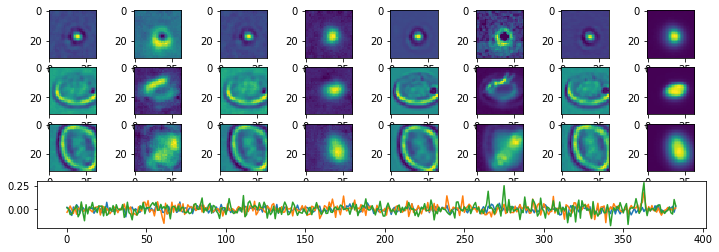

Epoch:  46 Iteration:  0 Loss:  3.10893 0.629792 0.000217676


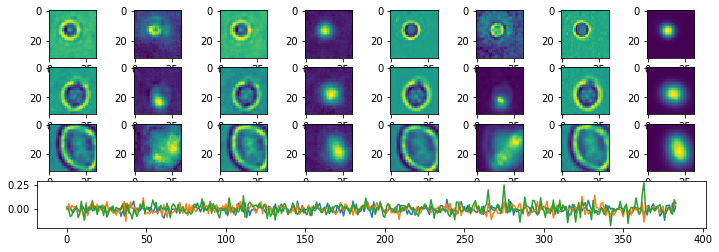

Epoch:  47 Iteration:  0 Loss:  3.02255 0.629748 0.000875413


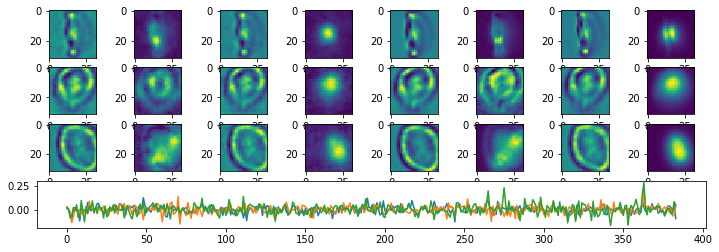

Epoch:  48 Iteration:  0 Loss:  2.97385 0.629722 0.000155479


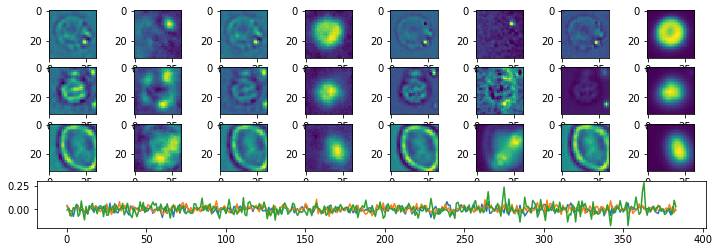

Epoch:  49 Iteration:  0 Loss:  2.97292 0.629722 0.000784576


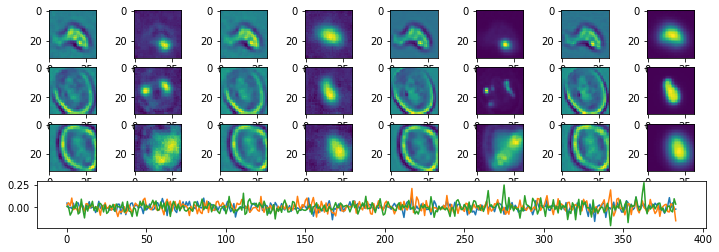

Epoch:  50 Iteration:  0 Loss:  2.93878 0.629705 0.000531346


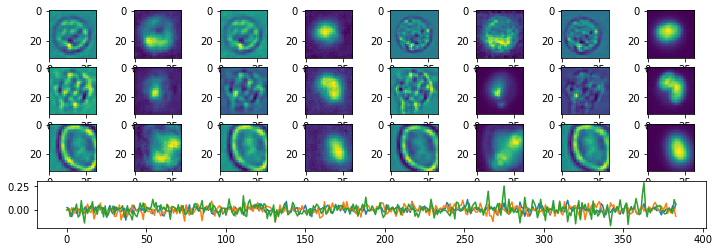

Epoch:  51 Iteration:  0 Loss:  2.8735 0.62967 0.00030458


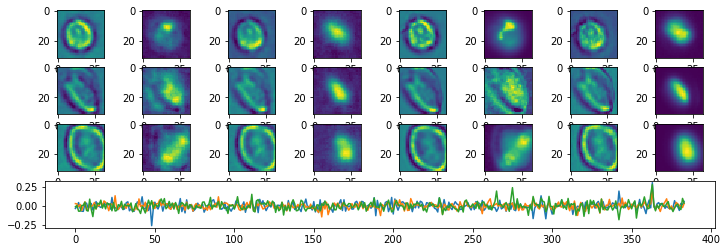

Epoch:  52 Iteration:  0 Loss:  2.8231 0.629646 0.000110239


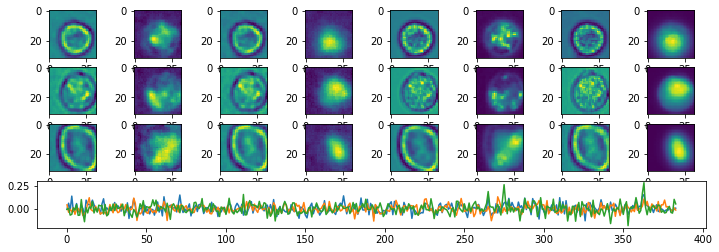

Epoch:  53 Iteration:  0 Loss:  2.83047 0.62965 0.000258595


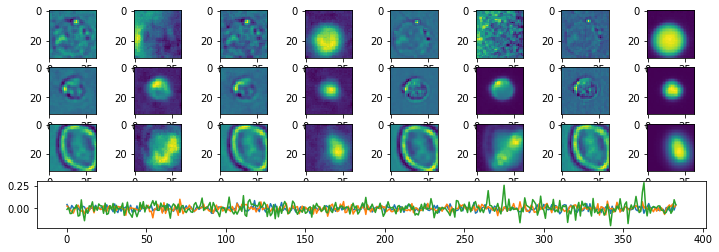

Epoch:  54 Iteration:  0 Loss:  2.73301 0.629598 0.000358909


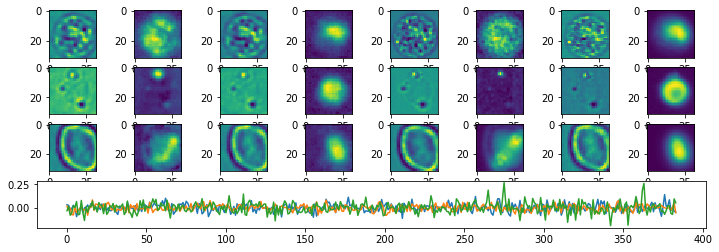

Epoch:  55 Iteration:  0 Loss:  2.70544 0.629584 0.000346124


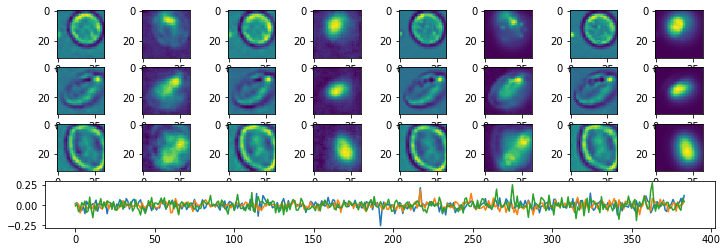

Epoch:  56 Iteration:  0 Loss:  2.73017 0.629597 0.000569224


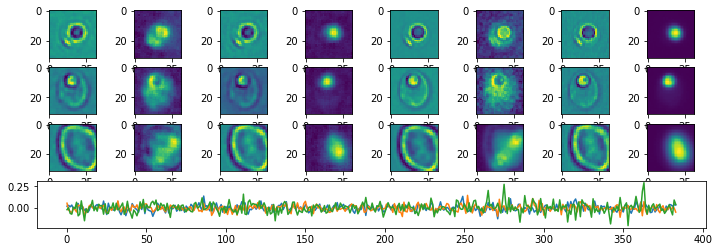

Epoch:  57 Iteration:  0 Loss:  2.68085 0.629571 0.000416219


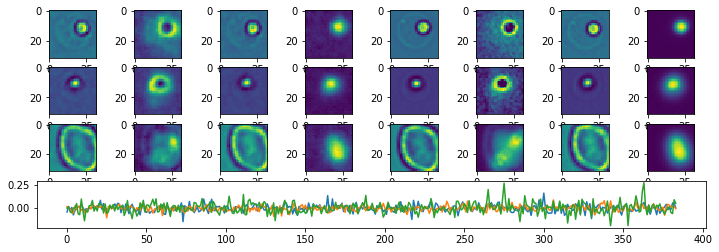

Epoch:  58 Iteration:  0 Loss:  2.64942 0.629555 0.000366539


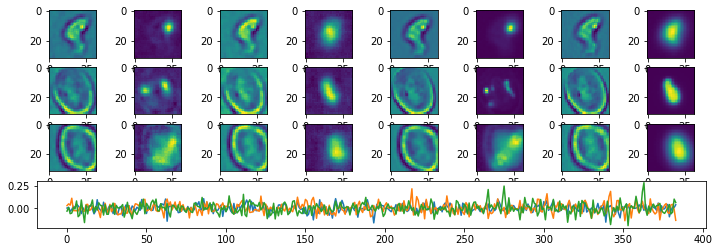

Epoch:  59 Iteration:  0 Loss:  2.62825 0.629545 0.000386208


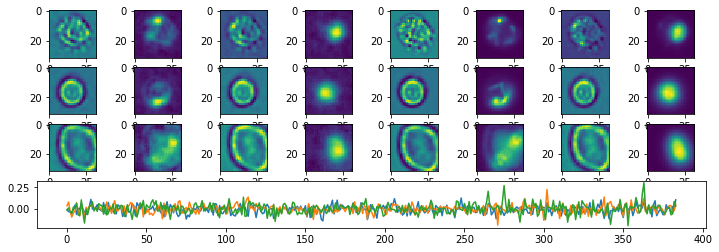

Epoch:  60 Iteration:  0 Loss:  2.59193 0.629525 0.000437975


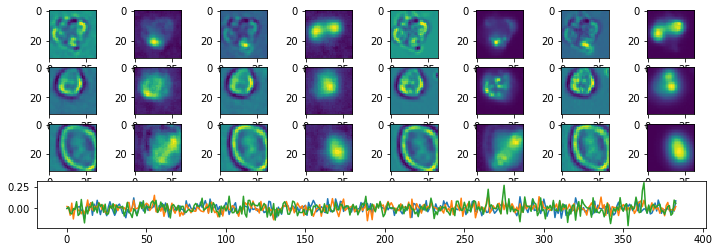

Epoch:  61 Iteration:  0 Loss:  2.62222 0.629543 0.000285834


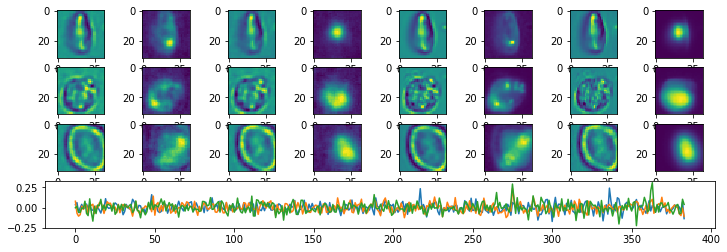

Epoch:  62 Iteration:  0 Loss:  2.53441 0.629496 0.000398785


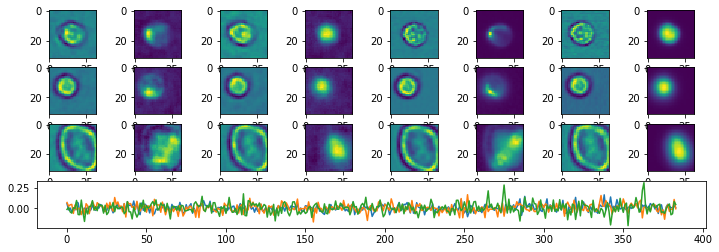

Epoch:  63 Iteration:  0 Loss:  2.54351 0.629501 0.000397027


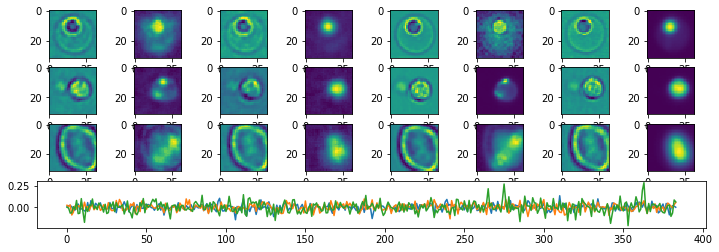

Epoch:  64 Iteration:  0 Loss:  2.51607 0.629486 0.000115216


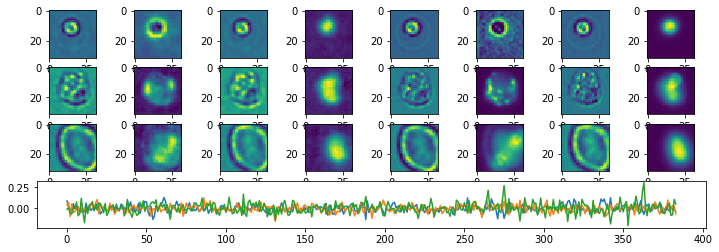

Epoch:  65 Iteration:  0 Loss:  2.50386 0.629481 0.000385135


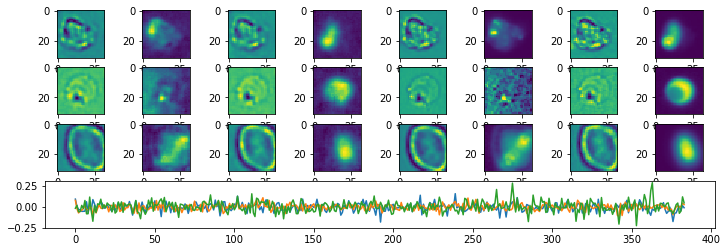

Epoch:  66 Iteration:  0 Loss:  2.48033 0.629469 0.000452012


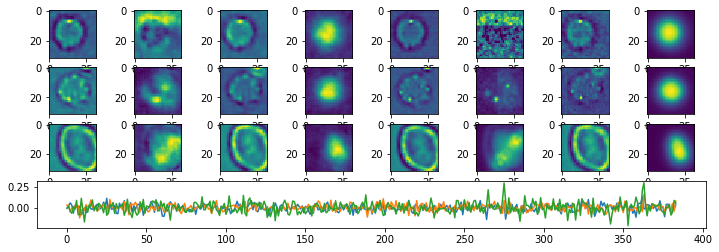

Epoch:  67 Iteration:  0 Loss:  2.47017 0.629463 8.70526e-05


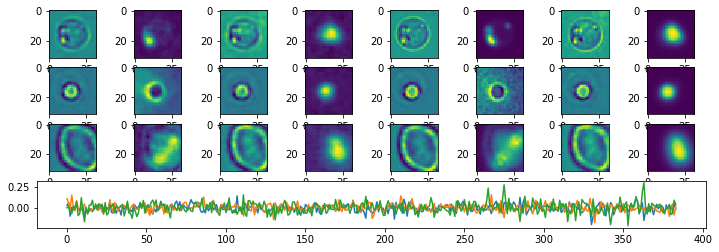

Epoch:  68 Iteration:  0 Loss:  2.45228 0.629454 0.000463784


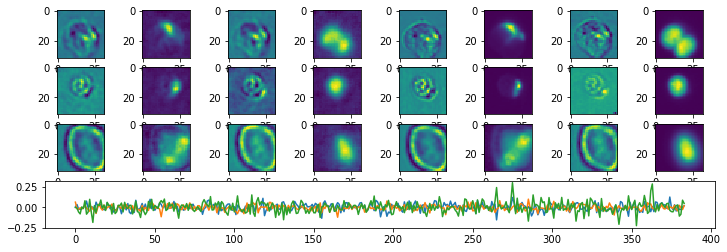

Epoch:  69 Iteration:  0 Loss:  2.43366 0.629446 0.00036338


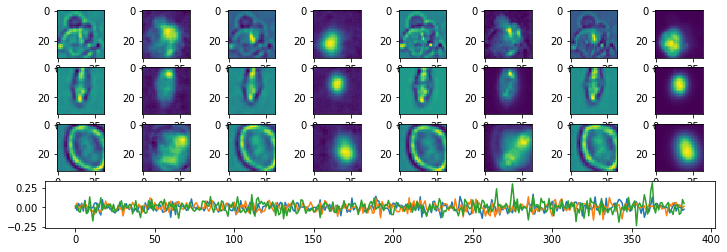

Epoch:  70 Iteration:  0 Loss:  2.40268 0.629428 0.000169009


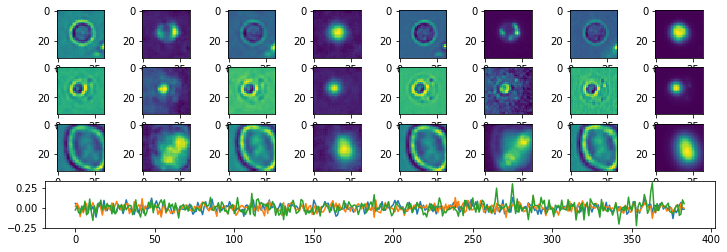

Epoch:  71 Iteration:  0 Loss:  2.39391 0.629423 0.000227213


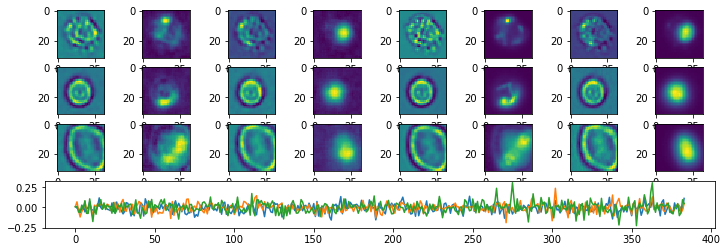

Epoch:  72 Iteration:  0 Loss:  2.38494 0.62942 7.86483e-05


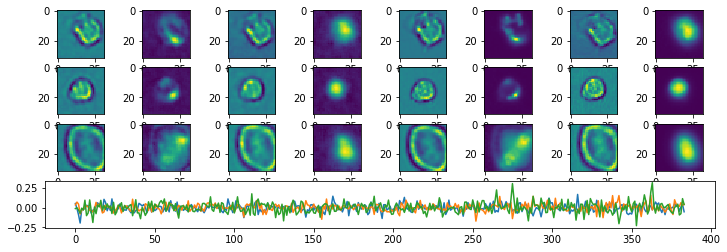

Epoch:  73 Iteration:  0 Loss:  2.36946 0.629411 0.000263602


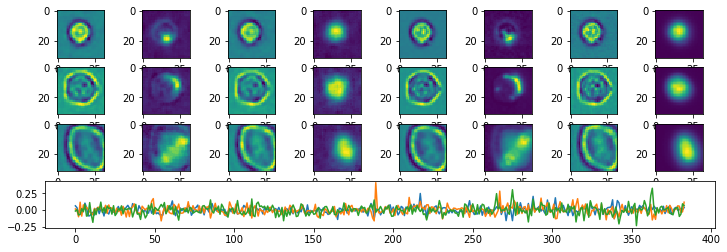

Epoch:  74 Iteration:  0 Loss:  2.367 0.629412 0.000293612


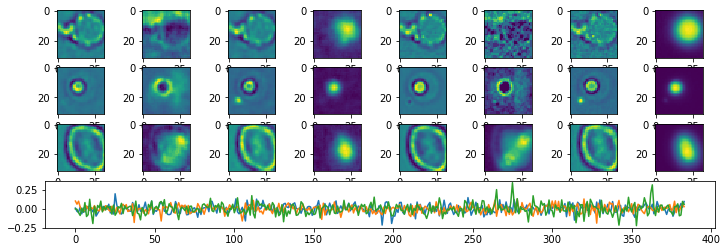

Epoch:  75 Iteration:  0 Loss:  2.3523 0.629405 0.000747651


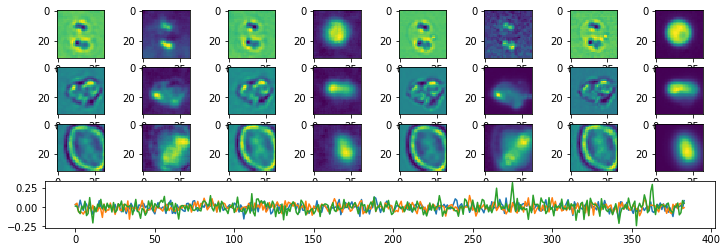

Epoch:  76 Iteration:  0 Loss:  2.31974 0.629385 0.000121504


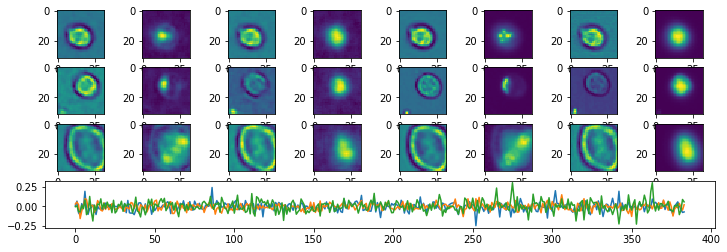

Epoch:  77 Iteration:  0 Loss:  2.32567 0.629389 9.26554e-05


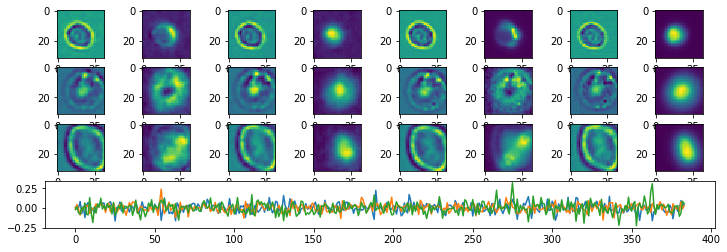

Epoch:  78 Iteration:  0 Loss:  2.33165 0.629393 0.000841022


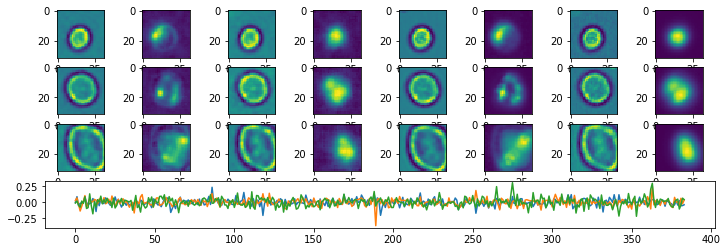

Epoch:  79 Iteration:  0 Loss:  2.28379 0.629367 0.000288934


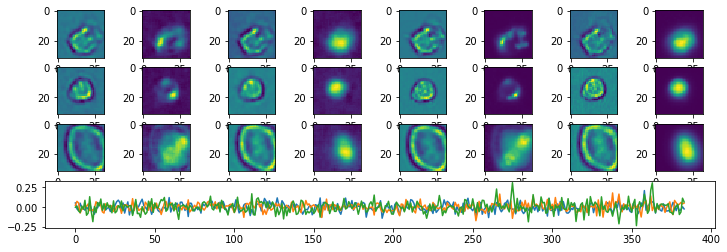

Epoch:  80 Iteration:  0 Loss:  2.30573 0.629383 0.000510573


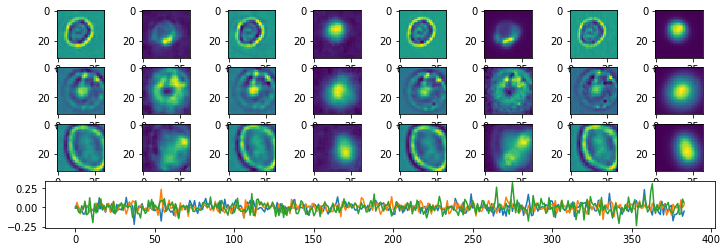

Epoch:  81 Iteration:  0 Loss:  2.2695 0.629359 0.000208557


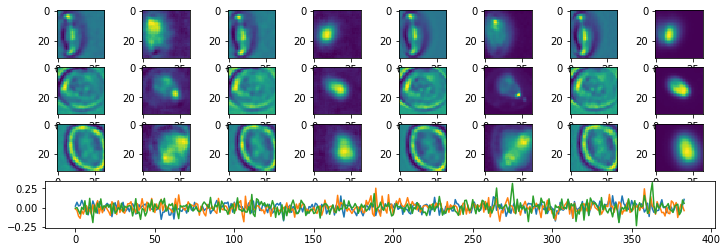

Epoch:  82 Iteration:  0 Loss:  2.25968 0.629354 0.000543356


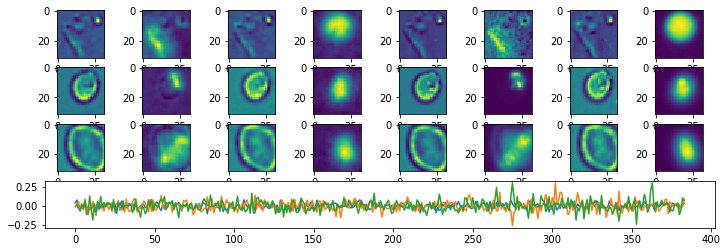

Epoch:  83 Iteration:  0 Loss:  2.25997 0.629354 0.000334799


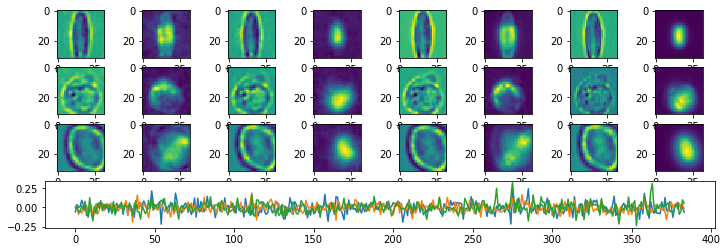

Epoch:  84 Iteration:  0 Loss:  2.23462 0.629341 5.20647e-05


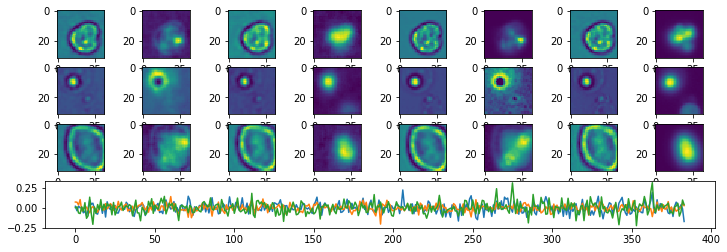

Epoch:  85 Iteration:  0 Loss:  2.22715 0.629337 6.34193e-05


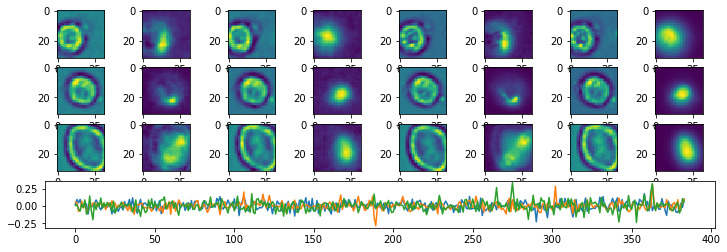

Epoch:  86 Iteration:  0 Loss:  2.22762 0.629338 0.000145018


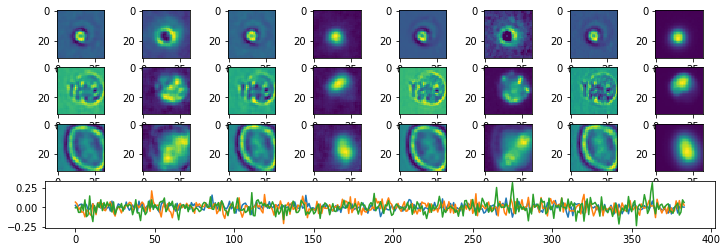

Epoch:  87 Iteration:  0 Loss:  2.21046 0.629328 9.41753e-05


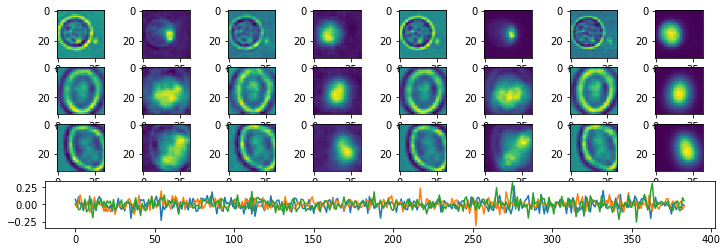

Epoch:  88 Iteration:  0 Loss:  2.1907 0.62932 0.000245273


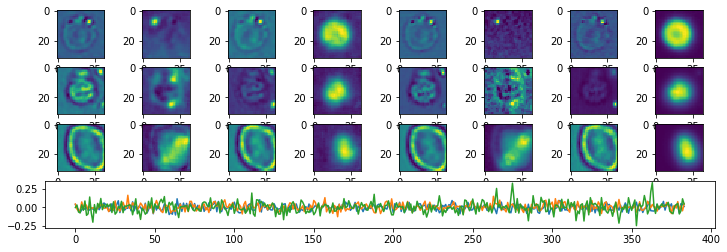

Epoch:  89 Iteration:  0 Loss:  3.60137 0.630077 0.000667721


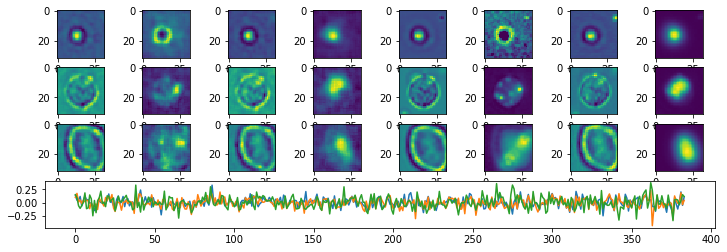

Epoch:  90 Iteration:  0 Loss:  2.70618 0.629591 0.000267267


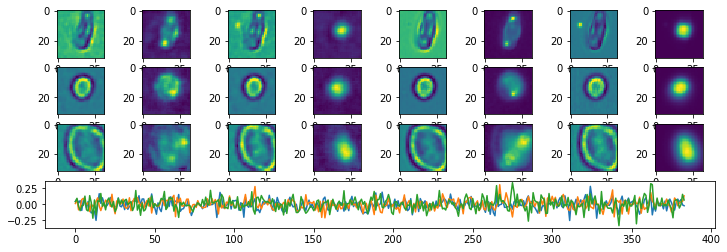

Epoch:  91 Iteration:  0 Loss:  2.52242 0.629495 0.000258148


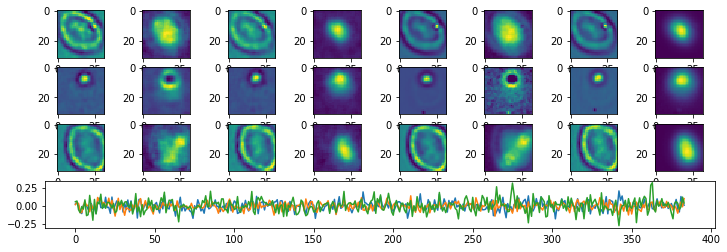

Epoch:  92 Iteration:  0 Loss:  2.43801 0.629455 0.000266671


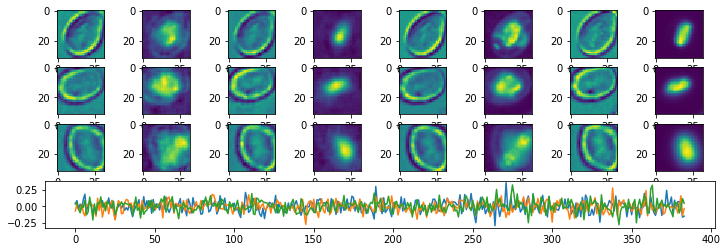

Epoch:  93 Iteration:  0 Loss:  2.37067 0.629414 0.000350356


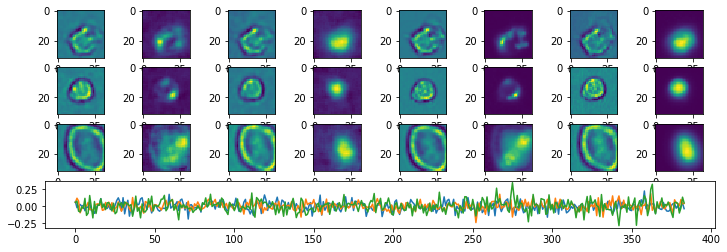

Epoch:  94 Iteration:  0 Loss:  2.33193 0.629393 0.000326812


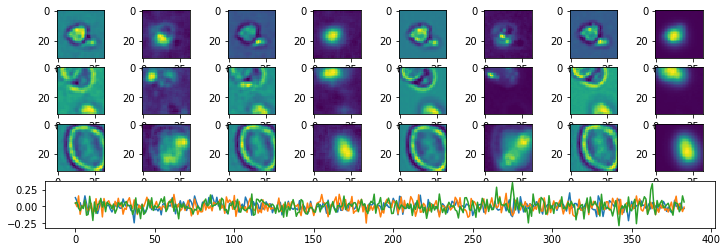

Epoch:  95 Iteration:  0 Loss:  2.29648 0.629373 0.000323296


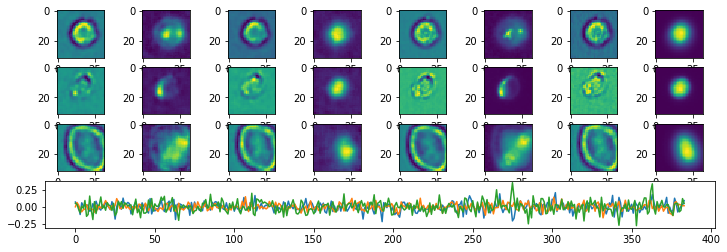

Epoch:  96 Iteration:  0 Loss:  2.28092 0.629367 0.000315547


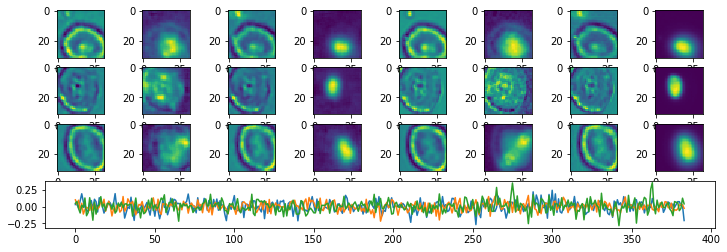

Epoch:  97 Iteration:  0 Loss:  2.25809 0.629355 0.000278711


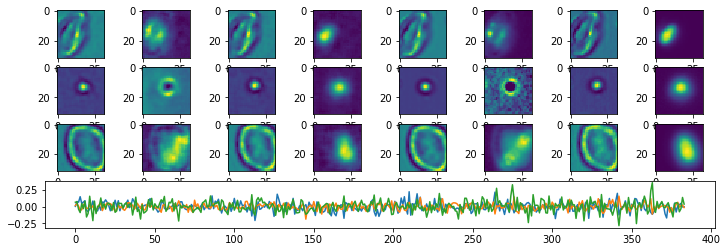

Epoch:  98 Iteration:  0 Loss:  2.25215 0.629353 0.000232399


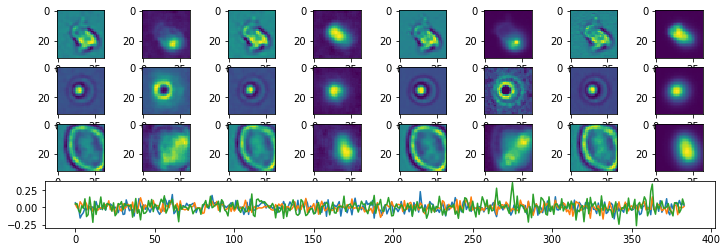

Epoch:  99 Iteration:  0 Loss:  2.2405 0.629346 0.000230193


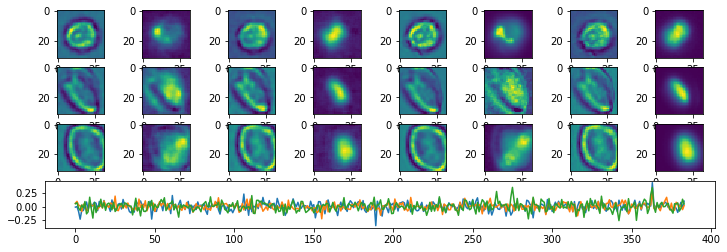

Epoch:  100 Iteration:  0 Loss:  2.23595 0.629343 0.000322044


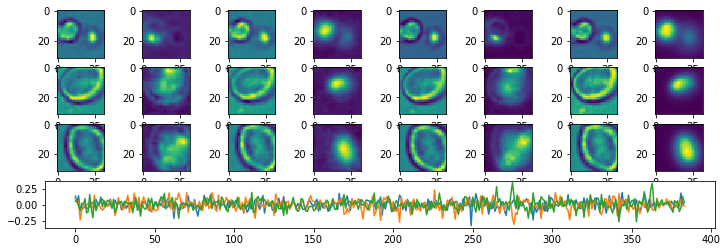

Epoch:  101 Iteration:  0 Loss:  2.22664 0.629339 0.00024876


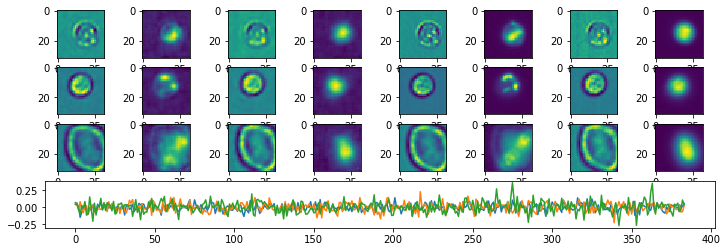

Epoch:  102 Iteration:  0 Loss:  2.21801 0.629333 0.000328153


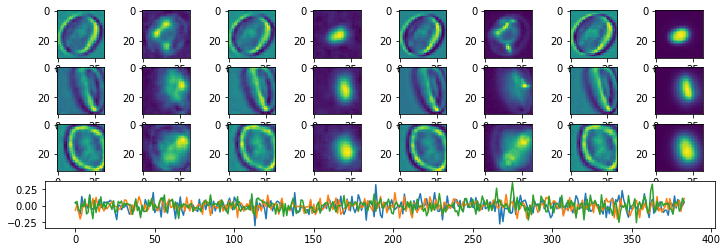

Epoch:  103 Iteration:  0 Loss:  2.20014 0.629325 0.000330448


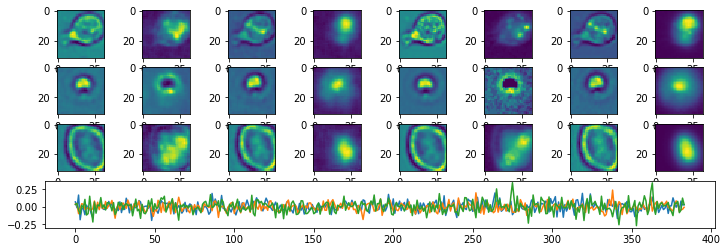

Epoch:  104 Iteration:  0 Loss:  2.19404 0.62932 0.000265777


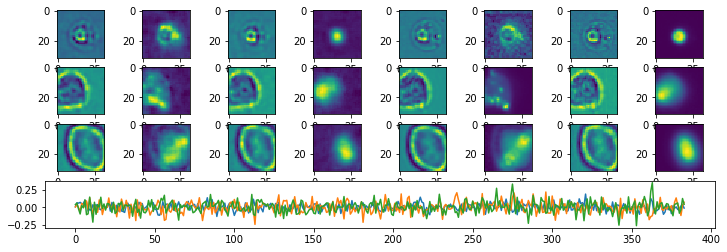

Epoch:  105 Iteration:  0 Loss:  2.19491 0.62932 0.000320435


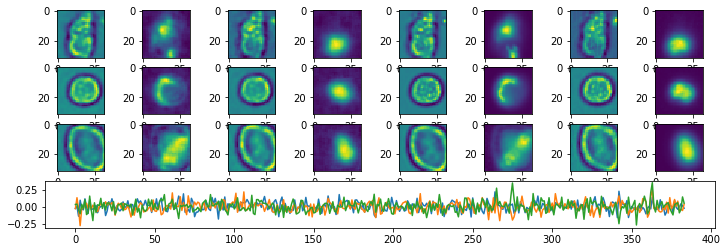

Epoch:  106 Iteration:  0 Loss:  2.19438 0.629323 0.000231326


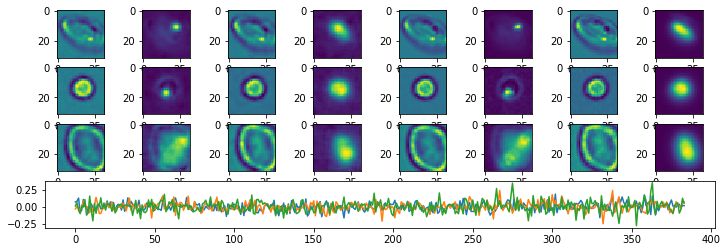

Epoch:  107 Iteration:  0 Loss:  2.18706 0.629317 0.000355244


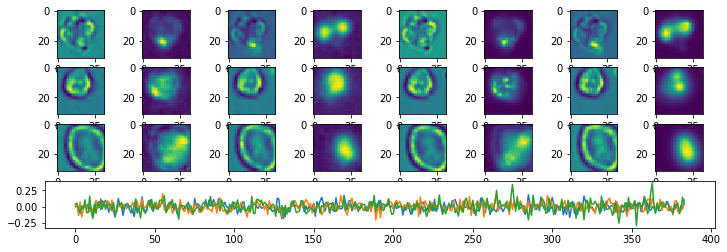

Epoch:  108 Iteration:  0 Loss:  2.18098 0.629314 0.000183702


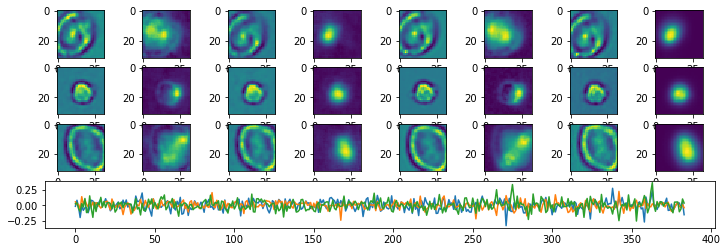

Epoch:  109 Iteration:  0 Loss:  2.17981 0.629312 0.000153005


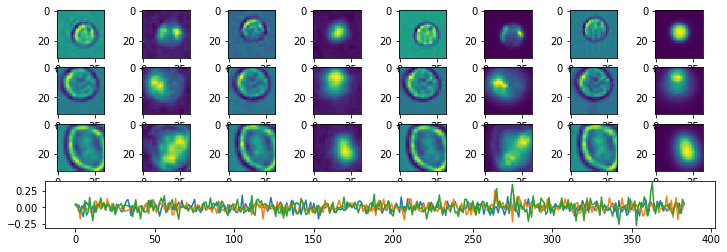

Epoch:  110 Iteration:  0 Loss:  2.16576 0.629307 0.000324339


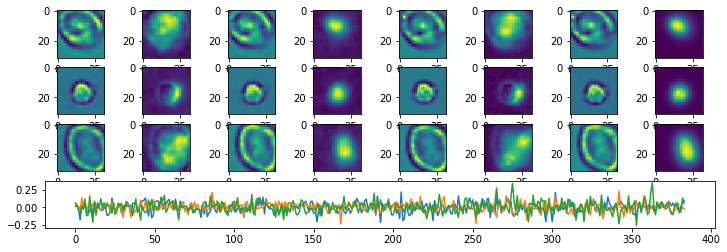

Epoch:  111 Iteration:  0 Loss:  2.16442 0.629305 3.78191e-05


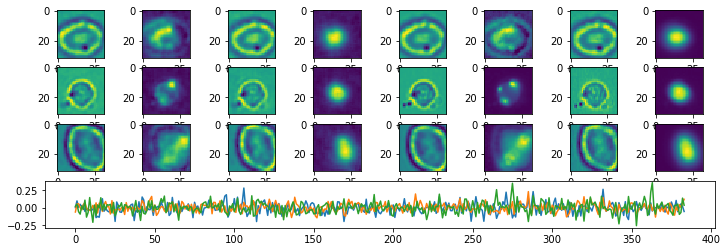

Epoch:  112 Iteration:  0 Loss:  2.16936 0.629308 0.000126302


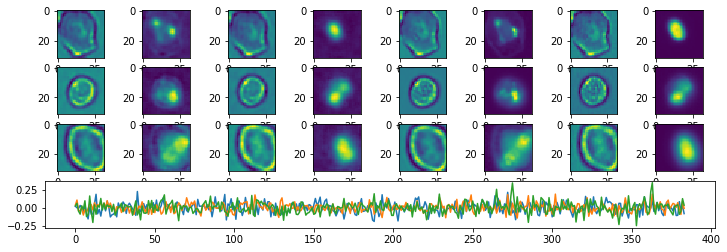

Epoch:  113 Iteration:  0 Loss:  2.15964 0.629303 0.000489473


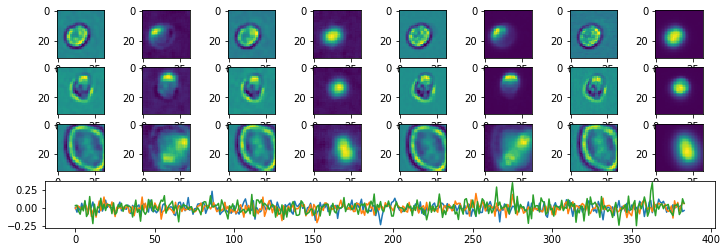

Epoch:  114 Iteration:  0 Loss:  2.16148 0.629305 0.000304192


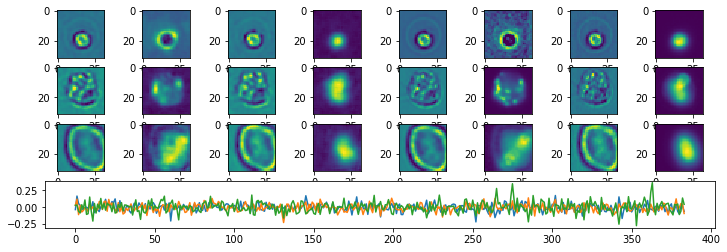

Epoch:  115 Iteration:  0 Loss:  2.15369 0.629301 0.0004071


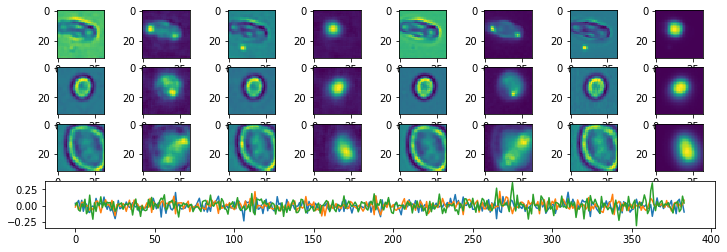

Epoch:  116 Iteration:  0 Loss:  2.15077 0.629297 0.000246495


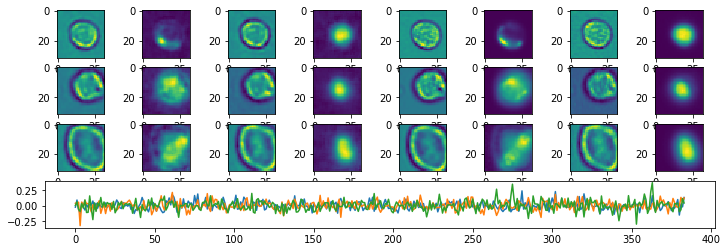

Epoch:  117 Iteration:  0 Loss:  2.14259 0.629293 3.57926e-05


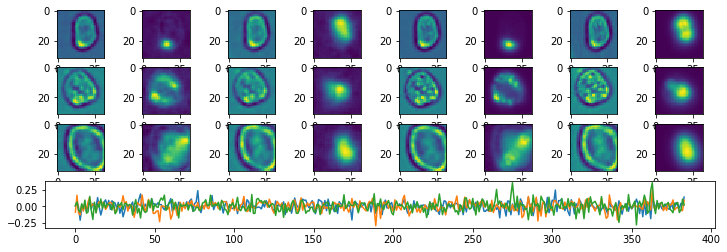

Epoch:  118 Iteration:  0 Loss:  2.13718 0.629293 0.000278205


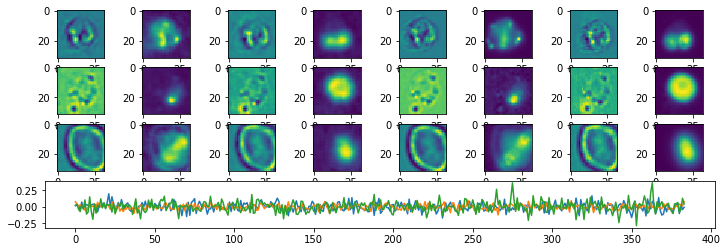

Epoch:  119 Iteration:  0 Loss:  2.13851 0.629293 0.00018394


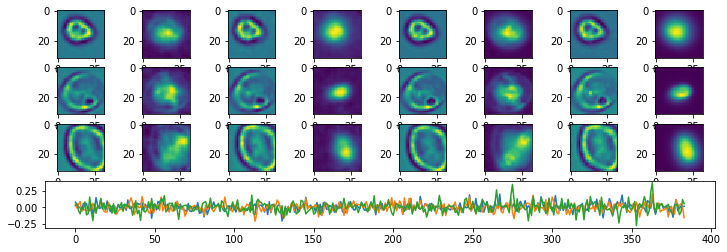

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 384 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-26-LS384"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4